<a href="https://colab.research.google.com/github/aka-gera/Regression/blob/main/analysing_second_hand_car_sales_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **REGRESSION**

*This algorithm will identify the optimal classification machine learning model for a given dataset.*

This dataset is provided by: https://www.kaggle.com/datasets/devantltd/analysing-second-hand-car-sales-data

In [ ]:
data_dir = f'devantltd/analysing-second-hand-car-sales-data'

# Import Dataset

In [ ]:
! pip install shap
import shap


In [ ]:
! pip install kaggle

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pwd
%cd /content

/content/drive/My Drive/ML2023/data-analysis
/content


In [ ]:
! mkdir ~/.kaggle

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [ ]:
! cp /content/drive/MyDrive/Kaggle_API/kaggle.json ~/.kaggle

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets download {data_dir}

Dataset URL: https://www.kaggle.com/datasets/devantltd/analysing-second-hand-car-sales-data
License(s): CC-BY-NC-SA-4.0
analysing-second-hand-car-sales-data.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
import os
file_names = os.listdir()
zip_file =   [file for file in file_names if file.endswith('.zip')]
zip_file

['analysing-second-hand-car-sales-data.zip']

In [ ]:
import zipfile

# Open the zip file
with zipfile.ZipFile(zip_file[-1], 'r') as zip_ref:
    zip_ref.extractall()
    unzipped_file_names = zip_ref.namelist()
unzipped_file_names

['second_hand_car_sales.csv']

# Import the helper classes

In [ ]:
!pwd
%cd /content/drive/MyDrive/ML2023/data-analysis

/content
/content/drive/MyDrive/ML2023/data-analysis


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
import math
from plotly.subplots import make_subplots

from aka_data_analysis.aka_plot import aka_plot, aka_correlation_analysis
from aka_data_analysis.aka_learning import aka_learn,aka_clean,aka_filter
from aka_data_analysis.aka_regression import aka_regression_analysis

aka_plot = aka_plot()
aka_corr_an = aka_correlation_analysis()
aka_clean = aka_clean()
aka_learn = aka_learn()
aka_filter = aka_filter()
aka_corr_an = aka_correlation_analysis()

In [ ]:
from aka_data_analysis.aka_nn import aka_nn

In [ ]:
import matplotlib.pyplot as plt

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import plotly.figure_factory as ff
import plotly.express as px
import numpy as np
import pandas as pd


# Dataset Information

In [ ]:
df = aka_clean.df_get(f'/content/{unzipped_file_names[0]}')

In [ ]:
df.head()

,Manufacturer,Model,Engine Size (L),Fuel Type,Year of Manufacture,Mileage,Price (£)
0,Mercedes-Benz,Cruze,1.418475,Electric,2013,61837,34792
1,Toyota,A4,4.492330,Electric,2003,128993,27129
2,Audi,C-Class,4.739375,Electric,2000,81362,29141
3,Nissan,Model 3,3.128423,Petrol,2011,168204,24731
4,Mercedes-Benz,Golf,1.650279,Diesel,2006,119405,27493


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Manufacturer         50000 non-null  object 
 1   Model                50000 non-null  object 
 2   Engine Size (L)      50000 non-null  float64
 3   Fuel Type            50000 non-null  object 
 4   Year of Manufacture  50000 non-null  int64  
 5   Mileage              50000 non-null  int64  
 6   Price (£)            50000 non-null  int64  
dtypes: float64(1), int64(3), object(3)
memory usage: 2.7+ MB


In [ ]:
fig = aka_plot.Plot_histogram_Features(df,[0,1,2,-2,-1] )
if fig is not None:
    fig.show()

In [ ]:
df.describe()

,Engine Size (L),Year of Manufacture,Mileage,Price (£)
count,50000.000000,50000.000000,50000.000000,50000.00000
mean,2.997673,2010.982260,100823.272820,25469.27348
std,1.157058,6.602222,57565.100593,14132.82692
min,1.000136,2000.000000,1001.000000,1000.00000
25%,1.992010,2005.000000,50553.750000,13240.50000
50%,2.992907,2011.000000,101049.500000,25592.00000
75%,4.007939,2017.000000,150490.250000,37684.00000
max,4.999996,2022.000000,199998.000000,49999.00000


# Clean Dataset

## Drop Duplicate data

In [ ]:
df.drop_duplicates()

,Manufacturer,Model,Engine Size (L),Fuel Type,Year of Manufacture,Mileage,Price (£)
0,Mercedes-Benz,Cruze,1.418475,Electric,2013,61837,34792
1,Toyota,A4,4.492330,Electric,2003,128993,27129
2,Audi,C-Class,4.739375,Electric,2000,81362,29141
3,Nissan,Model 3,3.128423,Petrol,2011,168204,24731
4,Mercedes-Benz,Golf,1.650279,Diesel,2006,119405,27493
...,...,...,...,...,...,...,...
49995,Chevrolet,Corolla,1.241130,Diesel,2021,163295,1110
49996,Nissan,Civic,3.741902,Electric,2012,85805,27877
49997,Toyota,Altima,2.501539,Hybrid,2016,187733,42132
49998,Ford,Model 3,2.066934,Electric,2022,136728,39121


## Swap the target and the last feature

In [ ]:
f = aka_clean.swap_features(df,-1)
df.head()

Invalid feature indices or feat_a is equal to feat_b.


,Manufacturer,Model,Engine Size (L),Fuel Type,Year of Manufacture,Mileage,Price (£)
0,Mercedes-Benz,Cruze,1.418475,Electric,2013,61837,34792
1,Toyota,A4,4.492330,Electric,2003,128993,27129
2,Audi,C-Class,4.739375,Electric,2000,81362,29141
3,Nissan,Model 3,3.128423,Petrol,2011,168204,24731
4,Mercedes-Benz,Golf,1.650279,Diesel,2006,119405,27493


### Drop feature(s)


In [ ]:
feat =  []
df = aka_clean.drop_feature(df,feat)
df.head()

,Manufacturer,Model,Engine Size (L),Fuel Type,Year of Manufacture,Mileage,Price (£)
0,Mercedes-Benz,Cruze,1.418475,Electric,2013,61837,34792
1,Toyota,A4,4.492330,Electric,2003,128993,27129
2,Audi,C-Class,4.739375,Electric,2000,81362,29141
3,Nissan,Model 3,3.128423,Petrol,2011,168204,24731
4,Mercedes-Benz,Golf,1.650279,Diesel,2006,119405,27493


##  Convert categorical variables into numerical representations

In [ ]:
mapping,swapMapping = aka_clean.CleaningVar(df)
df = aka_clean.CleaningDF(df,mapping)
df.head()

,Manufacturer,Model,Engine Size (L),Fuel Type,Year of Manufacture,Mileage,Price (£)
0,0,0,1.418475,0,2013,61837,34792
1,1,1,4.492330,0,2003,128993,27129
2,2,2,4.739375,0,2000,81362,29141
3,3,3,3.128423,1,2011,168204,24731
4,0,4,1.650279,2,2006,119405,27493


## Balance Dataset

In [ ]:
# aka_plot.plot_pie(df,-1)

In [ ]:
# df = aka_clean.balance_df(df,'j')
# aka_plot.plot_pie(df, -1)

## Correlation Matrix

In [ ]:
aka_corr_an.Plot_Correlation_Matrix(df)

In [ ]:

confidence_interval_limit =   [-3,3]             # Define the limits m of the confidence interval [-m, m] and eliminate the outliers'''

correlation_percentage_threshold = .5      # Set the limit of the correlation between the feature to be removed

df_filtered,corr_tmp = aka_learn.filter_drop_corr_df(df,confidence_interval_limit,correlation_percentage_threshold)

print(f'We dropped {df.shape[0]-df_filtered.shape[0]} outliers and remove {df.shape[1]-df_filtered.shape[1]} feature(s)')
print(f'The filtered dataset\'s shape is {df_filtered.shape} ')

We dropped 0 outliers and remove 0 feature(s)
The filtered dataset's shape is (50000, 7) 


## Graph the features that are highly correlated


In [ ]:
fig = aka_corr_an.Plot_Correlate_Features(df,list(corr_tmp))
if fig is not None:
    fig.show()

Empty list is provided.


### Visualize the distribution of the filtered dataset

In [ ]:
aka_plot.Plot_box_Features(df,df_filtered,corr_tmp=range(df_filtered.shape[1]))

# Search for the most effective ML algorithm to learn the dataset

In [ ]:
pre_proc = 'XY'                                # Choose between 'XY' to standardize both 'X' and 'Y',
                                              #                'X' to standardize only 'X',
                                              #                'Y' to standardize only 'Y',

X_train, X_test, y_train, y_test = aka_learn.Learning_data(df_filtered,pre_proc)

## Linear Regression

In [ ]:

from sklearn.linear_model import LinearRegression
from scipy import stats
from sklearn.metrics import r2_score


clf = LinearRegression()
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)
print("R-squared score (Linear Regression):", r2_score(y_test, y_pred))

R-squared score (Linear Regression): 1.0


In [ ]:
params = np.append(clf.intercept_,clf.coef_)
print(params)
y_pred = clf.predict(X_train)
feat_name = df_filtered.columns[:-1]

aka_regression_analysis().plot_regression_summary(X_train, y_train, y_pred, params, feat_name)

[ 2.81892565e-17  2.85671363e-16  1.94722710e-16 -4.45173412e-16
  4.57533317e-17  6.23307829e-16  1.00000000e+00]
[5.43933447e-18 5.44237715e-18 5.44156970e-18 5.44169738e-18
 5.44766366e-18 5.44732627e-18 5.42654019e-18]


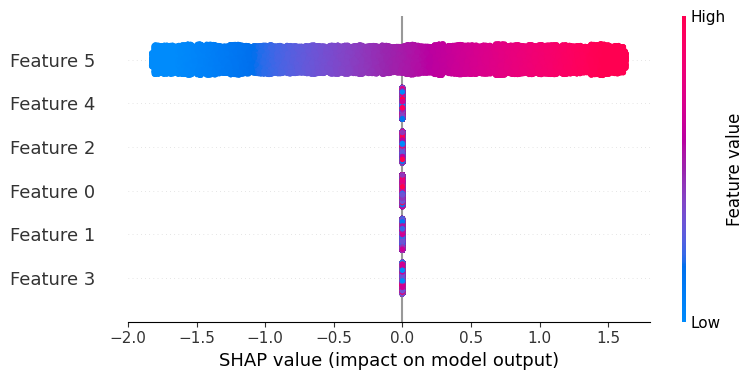

In [ ]:
explainer = shap.Explainer(clf, X_train)
shap_values = explainer(X_train)
shap.summary_plot(shap_values, X_train)

## Xgboost Regression

In [ ]:
import xgboost as xgb  # Importing xgboost library as xgb

clf = xgb.XGBRegressor()
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)
print("R-squared score (XGBoost classifier):", r2_score(y_test, y_pred))


R-squared score (XGBoost classifier): 0.999982927040949


100%|===================| 34923/35000 [01:53<00:00]       

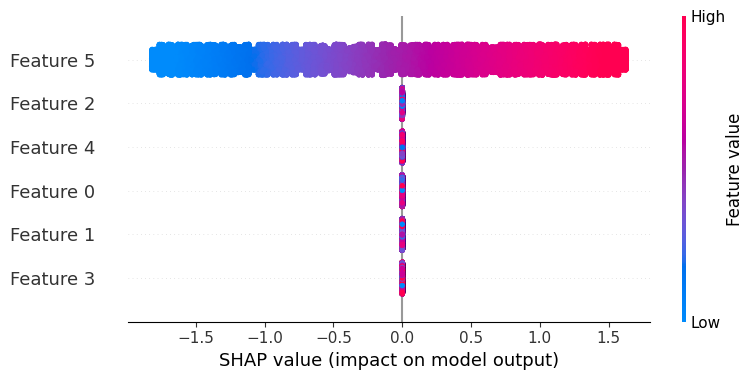

In [ ]:
explainer = shap.Explainer(clf, X_train)
shap_values = explainer(X_train)
shap.summary_plot(shap_values, X_train)

# Statsmodels Regression

In [ ]:

from statsmodels.regression import linear_model
from statsmodels.api import add_constant

# Add a constant to the independent variable matrix
X_train_with_const = add_constant(X_train)

# Fit the OLS model
model = linear_model.OLS(y_train, X_train_with_const)
results = model.fit()

# Print the summary of the regression results
print("Summary:")
print(results.summary())


Summary:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.274e+34
Date:                Fri, 10 May 2024   Prob (F-statistic):               0.00
Time:                        06:23:21   Log-Likelihood:             1.1728e+06
No. Observations:               35000   AIC:                        -2.346e+06
Df Residuals:                   34993   BIC:                        -2.345e+06
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.169e-16   3.63e-18     59.828

# Neural Net

## Neural Network Parameters

In [ ]:
activation = 'relu'
epoch = 10
num_nodes = [2,4]
dropout_prob = [0.05,0.1]
lr = [0.01,0.1]
batch_size = [2,4]

In [ ]:

myNN = aka_nn(X_train, X_test, y_train, y_test,activation)
model,scre =myNN.DNN(epoch,num_nodes,dropout_prob,lr,batch_size)


2 nodes, dropout 0.05, lr 0.01, batch size 2
469/469 [==============================] - 1s 2ms/step - loss: 0.0435 - accuracy: 0.0000e+00
2 nodes, dropout 0.05, lr 0.01, batch size 4
469/469 [==============================] - 1s 1ms/step - loss: 0.9905 - accuracy: 0.0000e+00
2 nodes, dropout 0.05, lr 0.1, batch size 2
469/469 [==============================] - 1s 1ms/step - loss: 0.9889 - accuracy: 0.0000e+00
2 nodes, dropout 0.05, lr 0.1, batch size 4
469/469 [==============================] - 1s 1ms/step - loss: 0.9906 - accuracy: 0.0000e+00
2 nodes, dropout 0.1, lr 0.01, batch size 2
469/469 [==============================] - 1s 1ms/step - loss: 0.1861 - accuracy: 0.0000e+00
2 nodes, dropout 0.1, lr 0.01, batch size 4
469/469 [==============================] - 63s 1ms/step - loss: 0.0469 - accuracy: 0.0000e+00
2 nodes, dropout 0.1, lr 0.1, batch size 2
469/469 [==============================] - 1s 2ms/step - loss: 0.9981 - accuracy: 0.0000e+00
2 nodes, dropout 0.1, lr 0.1, batch siz

In [ ]:
y_pred = model.predict(X_test)
print("R-squared score (DNN):", r2_score(y_test, y_pred))

469/469 [==============================] - 1s 2ms/step
R-squared score (DNN): 0.9853718830029592


 99%|===================| 34615/35000 [01:40<00:01]       

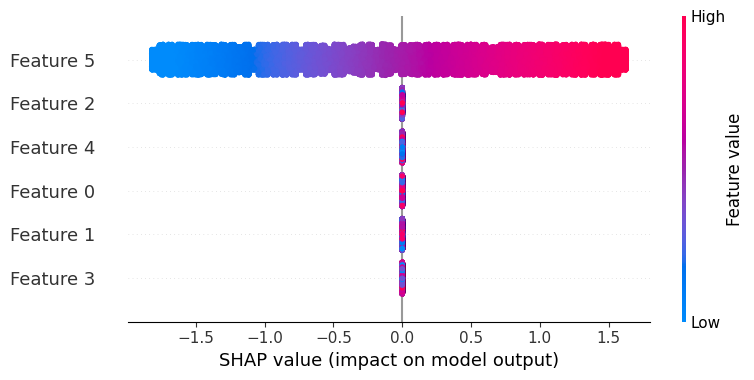

In [ ]:
explainer = shap.Explainer(clf, X_train)
shap_values = explainer(X_train)
shap.summary_plot(shap_values, X_train)